<a href="https://colab.research.google.com/github/ravidkrisi/Deep-Learning-Introduction/blob/main/bears_detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# set up

In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 34.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.3/519.3 kB 33.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.5 MB/s eta 0:00:00
Mounted at /content/gdrive


import computer vision library:

In [3]:
#hide
from fastbook import *
from fastai.vision.widgets import *

set up bing search


In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', 'bc2478f1ac824f0ebf8f342a3a78d9a7')
search_images_bing

<function fastbook.search_images_bing(key, term, min_sz=128, max_images=150)>

# download bears images

this part where we download images of 3 diffrent types of bears: grizzly, black, teddy.

create directory path to all bears

In [6]:
bear_types = 'grizzly','black','teddy'
path = Path('bears')


create path to every diffrent bear and dowloand 150 pictures of that type of bear

In [7]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bear')
        download_images(dest, urls=results.attrgot('contentUrl'))

check our work done correctly

In [8]:
fns = get_image_files(path)
fns

(#429) [Path('bears/black/a94de292-bf5d-48dd-a6a4-9064c6a803ab.jpg'),Path('bears/black/a09a9864-a8c7-4b37-86dd-b303ff521628.jpg'),Path('bears/black/140540d8-c5fa-4aa2-81bf-598d2e271b72.jpg'),Path('bears/black/0cabbc89-9452-4b70-9631-d96833f73e84.jpg'),Path('bears/black/18e6825c-c4bb-453d-8e18-02f6edcbb480.jpg'),Path('bears/black/eb260554-fe20-44cc-a226-ca5492812041.JPG'),Path('bears/black/cb13aca7-135d-4990-af11-f7d3084521cb.jpg'),Path('bears/black/5bb36da9-7580-4f3d-ae59-636ba94523ce.jpg'),Path('bears/black/0ed2fc73-3229-4736-aa80-934e9b37f1b6.JPG'),Path('bears/black/3bd38fb2-28f8-4401-b79e-f6e66001ca34.jpg')...]

check for coruppted downloaded files

In [9]:
failed = verify_images(fns)
failed

(#16) [Path('bears/black/88e70171-3d82-4ac3-ad9e-9280cfae060f.jpg'),Path('bears/black/94b83b01-3cab-4290-b4e7-6aaf0f592c05.jpg'),Path('bears/black/32ac0f25-ae02-4520-88ee-9ed40d6a9f87.jpg'),Path('bears/black/3c77c741-da36-40c4-837f-02c4b3eea4f0.jpg'),Path('bears/grizzly/c7397224-07b5-48e6-84a6-26f748d1ac08.jpg'),Path('bears/grizzly/1835bd3b-7d6b-4d06-bc5a-e4c2b0410562.jpg'),Path('bears/grizzly/1961c7fa-3cbd-48bf-aaee-7cea7c015433.jpg'),Path('bears/teddy/d59d6a18-754d-4657-95ff-2f829bc86516.JPG'),Path('bears/teddy/24e54c05-634e-4eef-8658-01bac0540fe4.JPG'),Path('bears/teddy/cd269618-742d-44d7-ab56-b2a99ab798fe.jpg')...]

remove all corrupted download files

In [10]:
failed.map(Path.unlink)

(#16) [None,None,None,None,None,None,None,None,None,None...]

# data to `DataLoaders`

we want to convet our data to `DataLoaders` in order to feed our architucture.

 - `blocks` - first argument the independent var format(Image of a bear), second argument the format of the dependent var(category name).
 -`get items`- `get_image_files` function takes a path, and returns a list of all of the images in that path.
 -`splitter`- split our data to train set and validation set. 20% of the data will be the validation set and we set `seed` to fixed number in oreder that everytime we run thin program it will take the same validation and train set.
 -`get_y`- `parent_label` function gets the name of the folder the file is in.
 -`item_tfms`- our images of diffrent sizes. we need to feed our architecture with the same size to all images in order to run. we resize of images to 128px.

In [13]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

the above was a "template" how to deal with our data and convert it to DataLoaders. in this cell we convert all our data that stored in path `path`

In [14]:
dls = bears.dataloaders(path)

`DataLoaders` is a class that created in order to feed architecture with a batch of objects. when you loop through `DataLoaders` will get by default a batch of 64 items everytime. we can take a look at a few by calling `show_batch` method

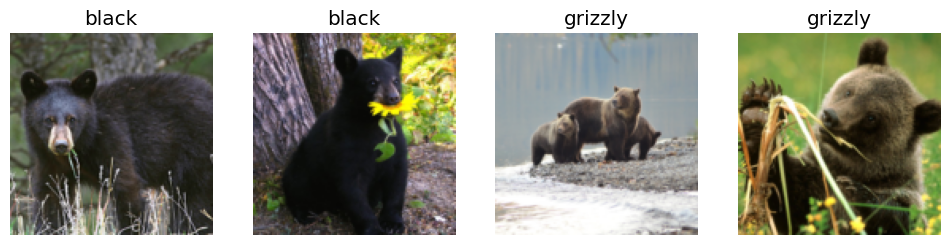

In [18]:
dls.valid.show_batch(max_n=4, nrows=1)


by default `resize` might crop parts of the image. in order to avoid it we can squish the image to align the the margins.

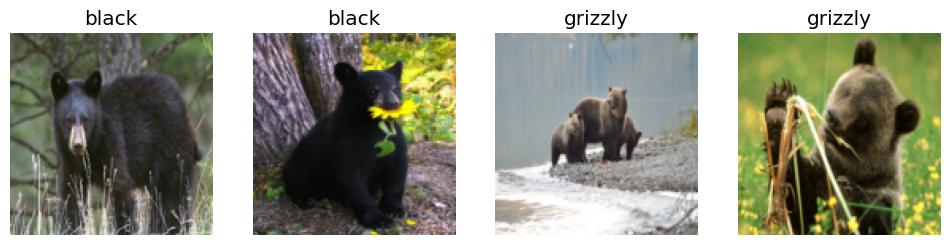

In [19]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

there is a diffrent way of padding the missing parts of the original image with black color

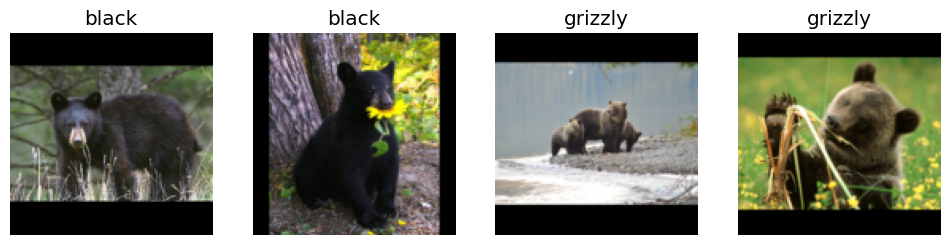

In [20]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)


those methods we described above might not be effactive to our use. if we squish the image the model will determines its predictions by object that does not look like the orginal. if we use the padding method we have a lot of empty space which will lead to wasted computation by the model.

insted what we will normally do is on each epoch(iteration on all images) we will select randomlly diffrent part of the image.

so we will replace `resize` with `RandomResizedCrop`.
`min_scale` determines how much of the image to select at minimum each time

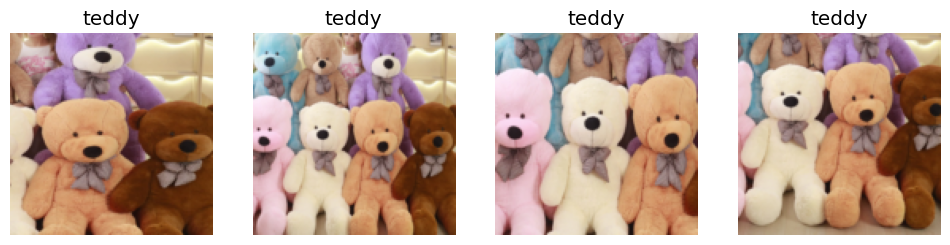

In [21]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

the `unique=True` means to have the same image repeated with different versions of `RandomResizedCrop`

# Data Augmentation

Data augmentation refers to creating random variations of our input data, such that they appear different, but do not actually change the meaning of the data. Examples of common data augmentation techniques for images are rotation, flipping, perspective warping, brightness changes and contrast changes

to implement it in code we can use `aug_transforms` function. we didn't use `RandomResizedCrop` in order to show how it works.

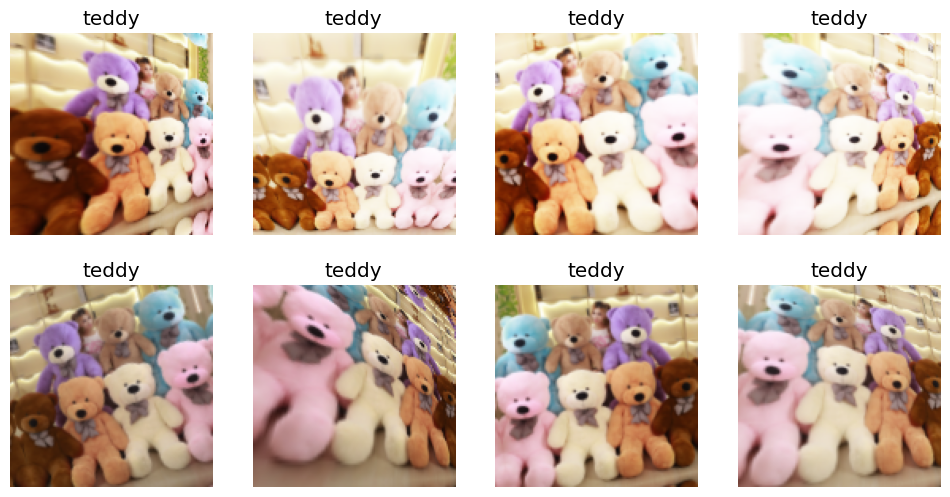

In [22]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

# train our model

we don't have a lot of data to our problem, so we'll use both `RandomResizedCrop` and `aug_transforms`

In [23]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

we set our `DataLoaders` so we can create our `Learner` now and fine-tune it in the usual way

In [24]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 209MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.291740,0.236727,0.097561,01:33


epoch,train_loss,valid_loss,error_rate,time
0,0.249019,0.194838,0.060976,01:58
1,0.214614,0.229038,0.060976,02:04
2,0.161119,0.234231,0.048780,01:57
3,0.136509,0.233750,0.048780,01:56


we will usr confusion matrix in order to check how good our model preformed

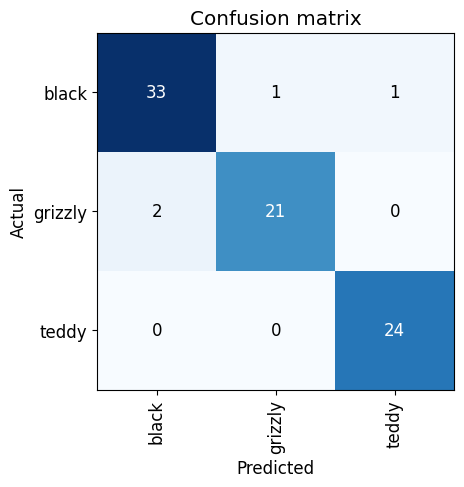

In [25]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

`plot_top_losses` shows us the images with the highest loss in our dataset

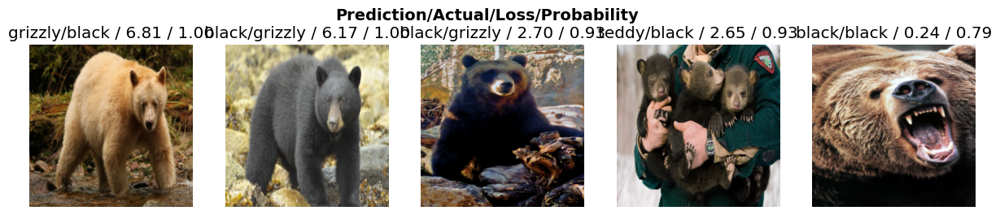

In [26]:
interp.plot_top_losses(5, nrows=1)

we can clearly see that the first image classifed incorrectly as black bear instead of grizzly bear. usually we will do our data cleaning ahead of training our model. but as we can see the model helped us to find the incorrect items.

fastai includes a handy GUI for data cleaning called ImageClassifierCleaner that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling

In [42]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

remove all items that we selected to delete

In [43]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

move all items we selected to change their labels to their correct category

In [44]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

lets retrain our model and check if accourcy improved

recreate the `DataLoaders` and `vision_learner` because we have deleted some data

In [45]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

In [46]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.313032,0.203178,0.060976,01:34


epoch,train_loss,valid_loss,error_rate,time
0,0.220749,0.101591,0.024390,02:09
1,0.170885,0.239091,0.060976,02:01
2,0.130153,0.233552,0.073171,02:09
3,0.119891,0.177087,0.048780,02:04


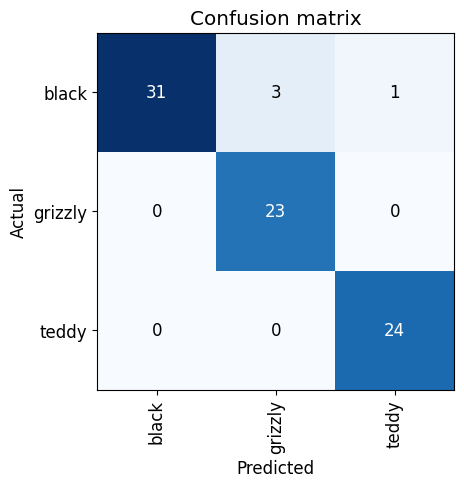

In [47]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

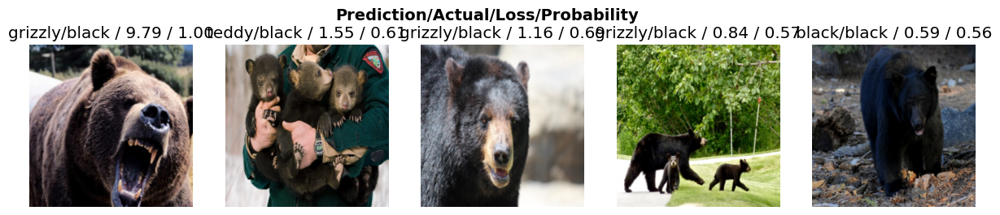

In [48]:
interp.plot_top_losses(5, nrows=1)